In [32]:
import numpy as np
import pandas as pd
import keras
from keras.models import Sequential, Model
from keras.layers import *
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import RMSprop
from keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.utils.np_utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import sklearn
import cv2
import scipy
import os
import sys
import csv
import matplotlib.pyplot as plt
%matplotlib inline
import pydicom
import tqdm
from skimage.transform import resize
import tensorflow as tf
from copy import deepcopy
print(os.listdir("../input/"))

# Any results you write to the current directory are saved as output.

['siimdicom', 'siim-acr-pneumothorax-segmentation']


Pre-Process (Structure data appropriately for Stage 1)

In [3]:
import glob

train_path = '../input/siimdicom/train-3/train-3/*/*/*.dcm'
test_path = '../input/siimdicom/test/test/*/*/*.dcm'

train_set = glob.glob(train_path)
test_set = glob.glob(test_path)

df_full = pd.read_csv('../input/siimdicom/train-rle.csv', index_col='ImageId')

In [4]:
print('The training set is of size ' + str(len(train_set)) + '.')
print('The testing set is of size ' + str(len(test_set)) + '.')

The training set is of size 10712.
The testing set is of size 1377.


In [5]:
# Note train_set_a is the training set.
# Note train_set_b is the validation set

# Break off validation set from training data
train_set_a, train_set_b = train_test_split(train_set, train_size=0.7, test_size=0.3)

In [6]:
print('The training set A is of size ' + str(len(train_set_a)) + '.')
print('The training set B is of size ' + str(len(train_set_b)) + '.')

The training set A is of size 7498.
The training set B is of size 3214.


In [7]:
def show_dicom_meta(data):
    print("Filename.........:", file_path)
    print("Storage type.....:", data.SOPClassUID)
    print()

    patient_name = data.PatientName
    display_name = patient_name
    print("Patient's name......:", display_name)
    print("Patient id..........:", data.PatientID)
    print("Patient's Age.......:", data.PatientAge)
    print("Patient's Sex.......:", data.PatientSex)
    print("Modality............:", data.Modality)
    print("Body Part Examined..:", data.BodyPartExamined)
    print("View Position.......:", data.ViewPosition)
    
    if 'PixelData' in data:
        rows = int(data.Rows)
        cols = int(data.Columns)
        print("Image size.......: {rows:d} x {cols:d}, {size:d} bytes".format(
            rows=rows, cols=cols, size=len(data.PixelData)))
        if 'PixelSpacing' in data:
            print("Pixel spacing....:", data.PixelSpacing)

def plot_dicom_img(data, figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.imshow(data.pixel_array, cmap=plt.cm.bone)
    plt.show()

Filename.........: ../input/siimdicom/train-3/train-3/1.2.276.0.7230010.3.1.2.8323329.3413.1517875177.732413/1.2.276.0.7230010.3.1.3.8323329.3413.1517875177.732412/1.2.276.0.7230010.3.1.4.8323329.3413.1517875177.732414.dcm
Storage type.....: 1.2.840.10008.5.1.4.1.1.7

Patient's name......: 644d68c8-a974-4c08-b7c5-75dd4645b513
Patient id..........: 644d68c8-a974-4c08-b7c5-75dd4645b513
Patient's Age.......: 48
Patient's Sex.......: F
Modality............: CR
Body Part Examined..: CHEST
View Position.......: AP
Image size.......: 1024 x 1024, 124168 bytes
Pixel spacing....: ['0.171', '0.171']


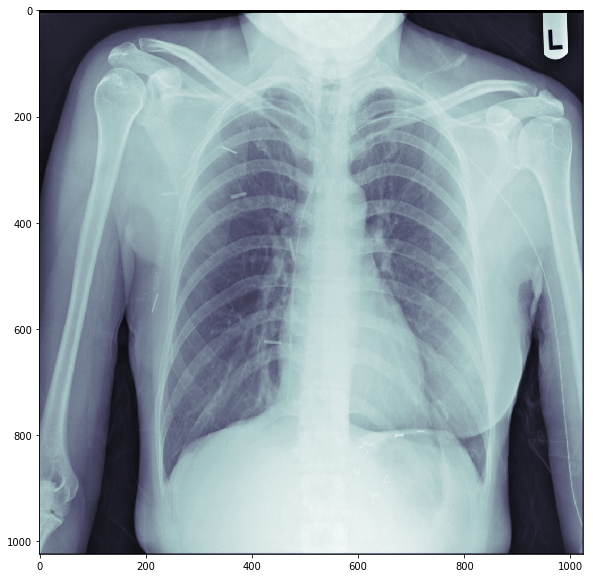

In [8]:
file_path = train_set_a[13]

data = pydicom.dcmread(file_path)
show_dicom_meta(data)
plot_dicom_img(data)

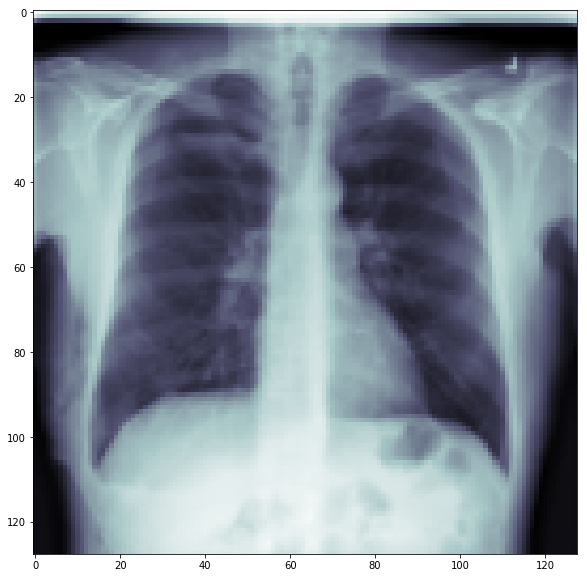

In [19]:
temp_file = pydicom.read_file(_id)
temp_image = resize(train_data.pixel_array, (128, 128), anti_aliasing=True).reshape(128,128,1)
plt.figure(figsize=(10, 10))
plt.imshow(temp_image.reshape(128,128), cmap=plt.cm.bone)
plt.show()

Retrieving training images and masks ... 


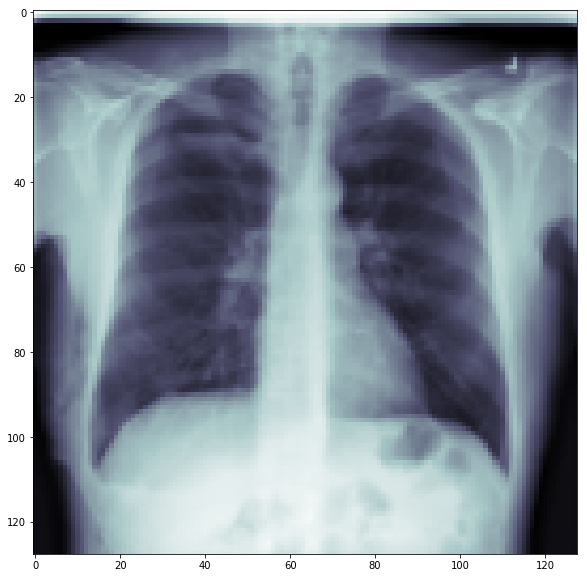

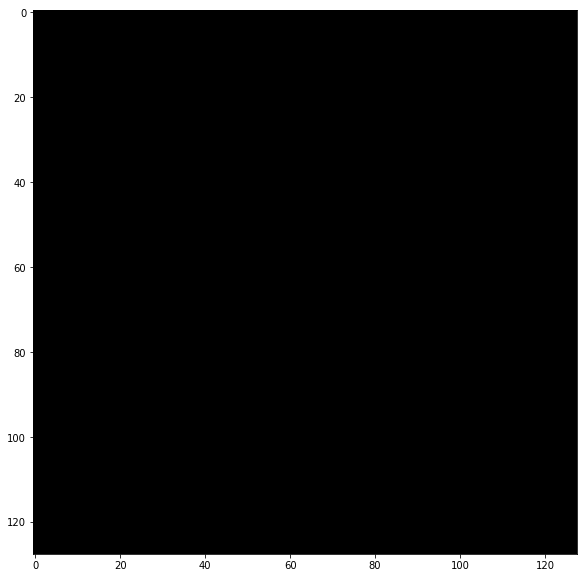

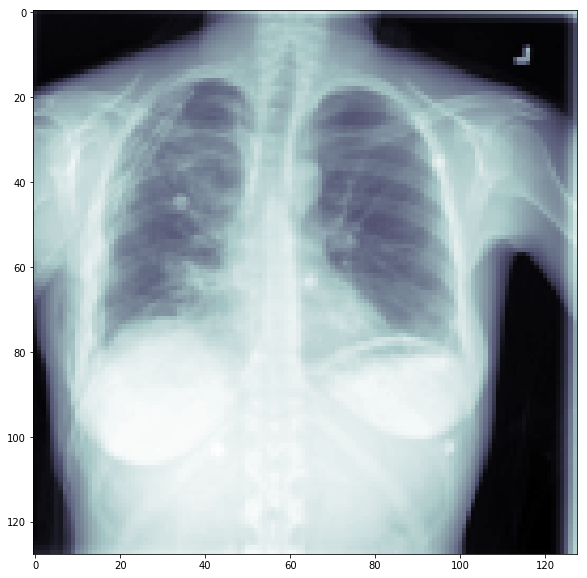

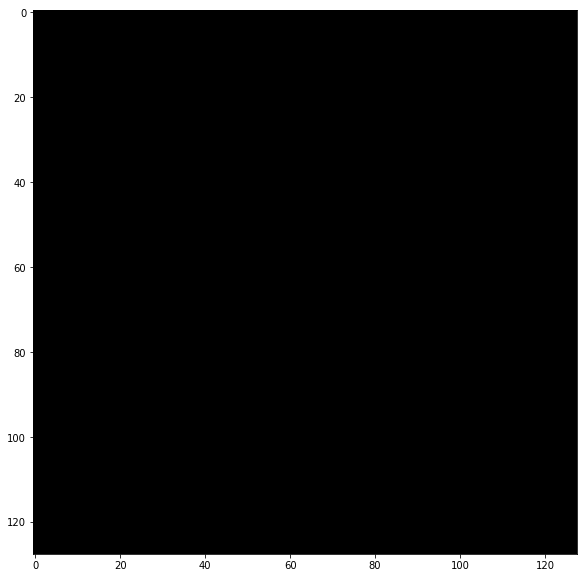

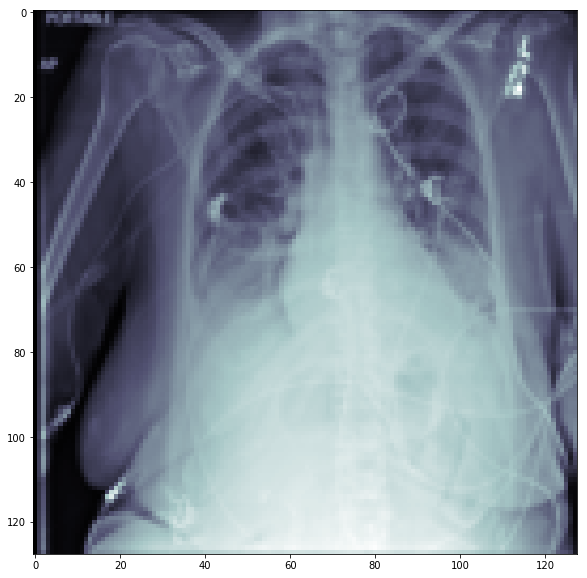

...

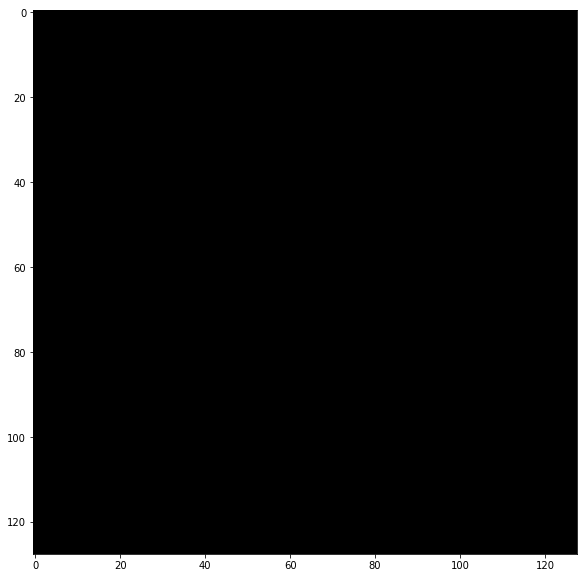

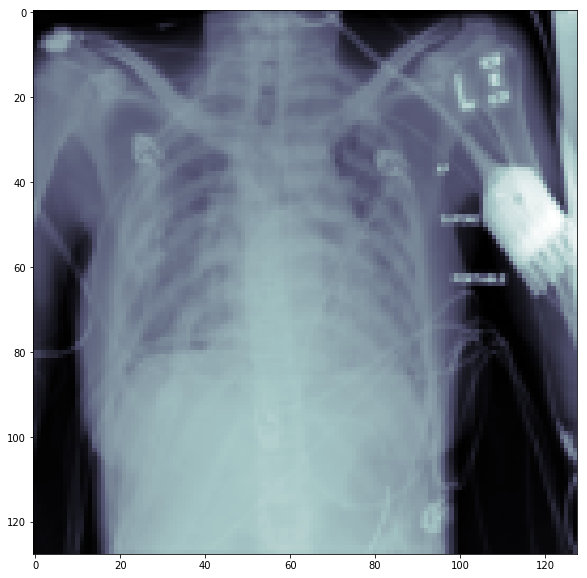

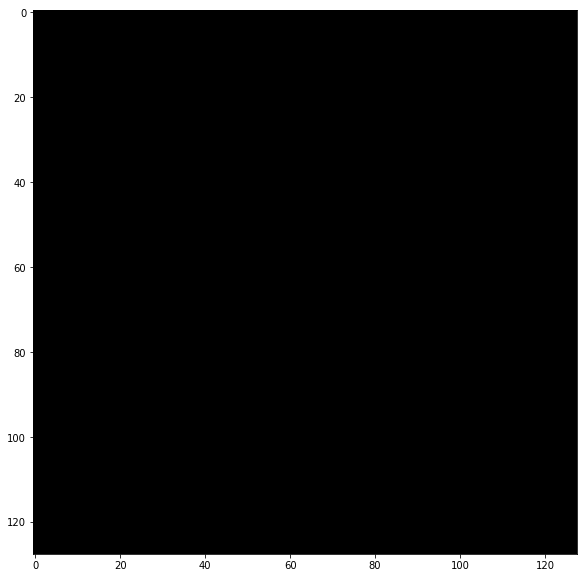

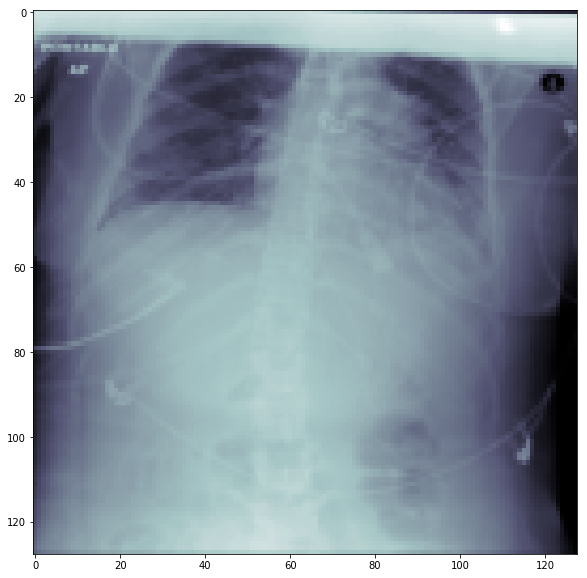

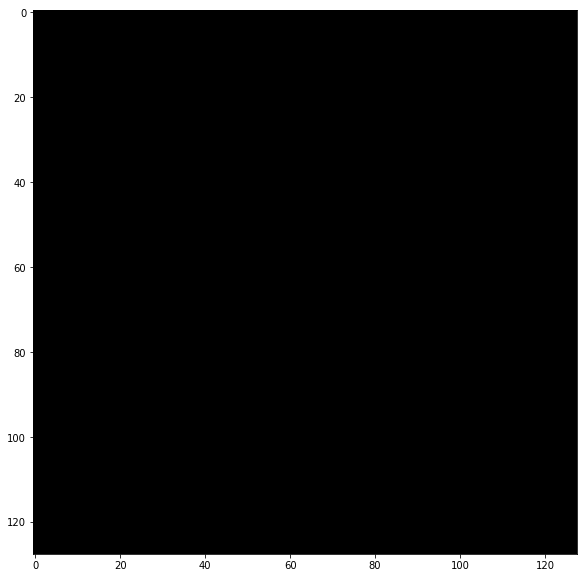

Key 1.2.276.0.7230010.3.1.4.8323329.2309.1517875172.75133 is without mask; hence non-diagnostic.


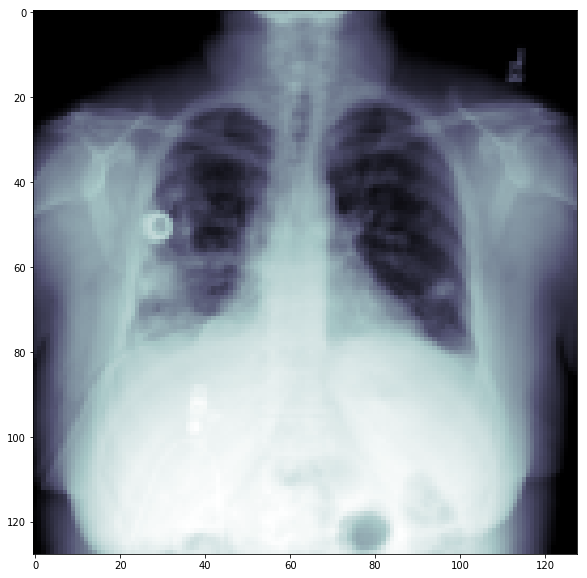

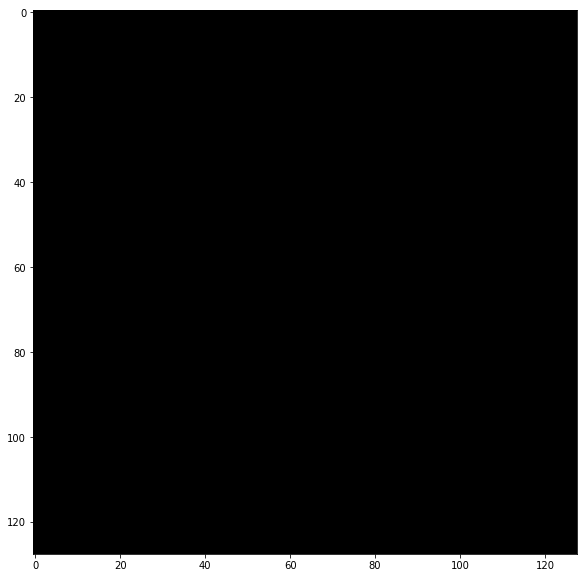

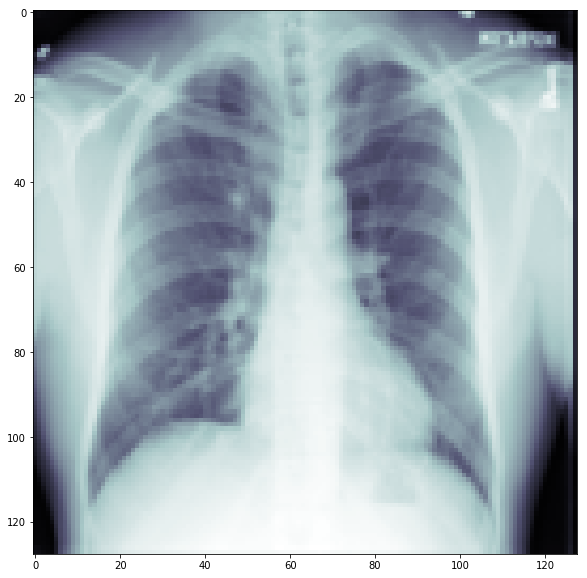

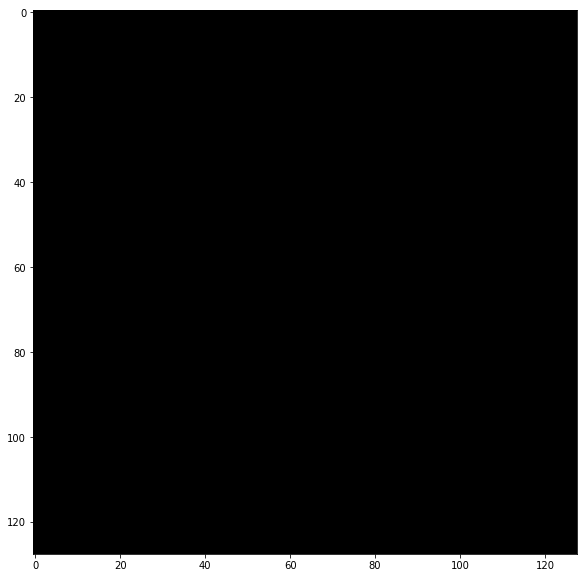

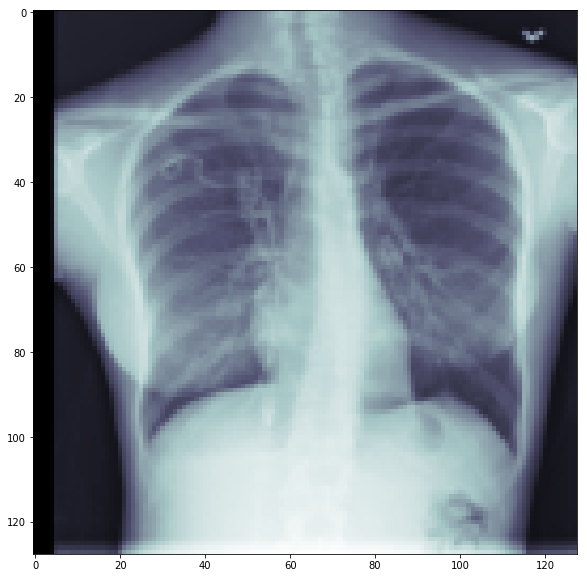

...

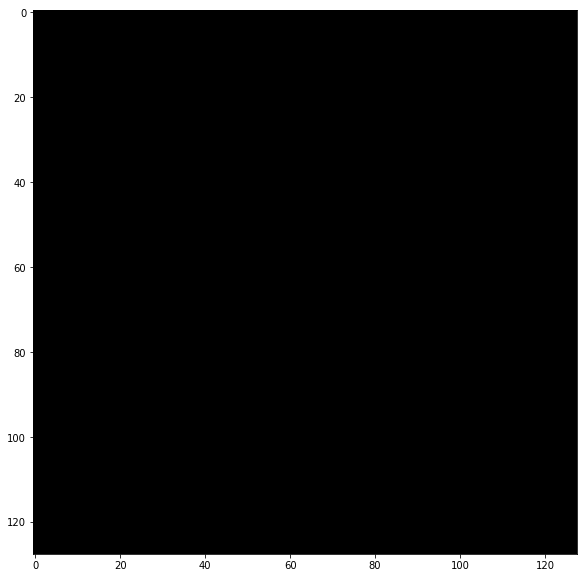

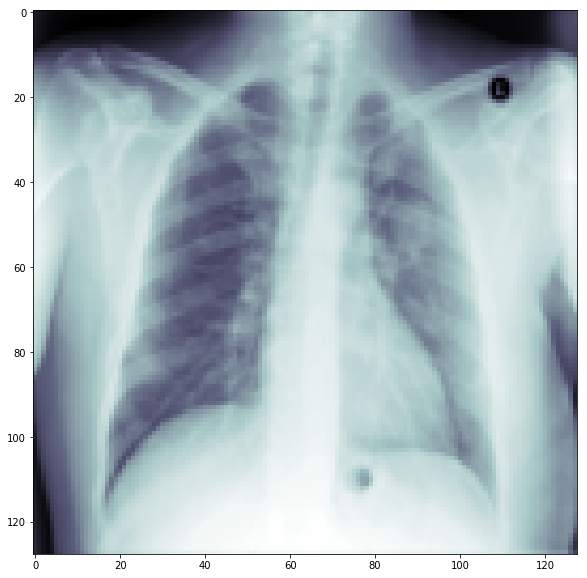

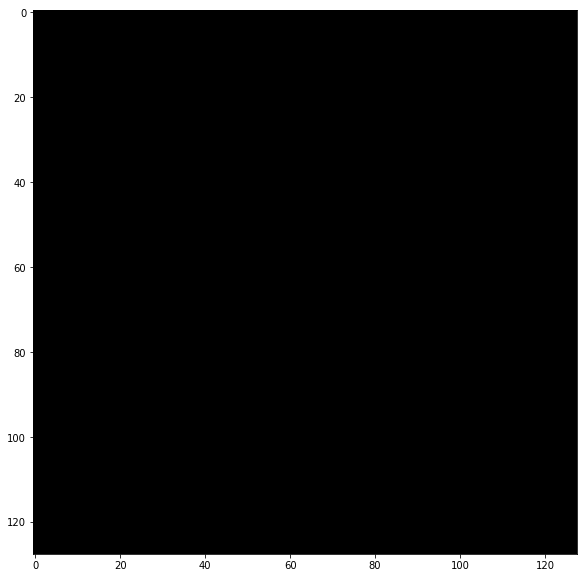

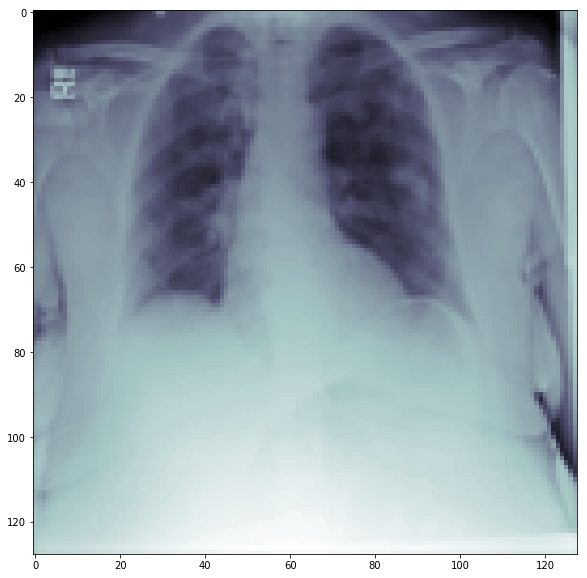

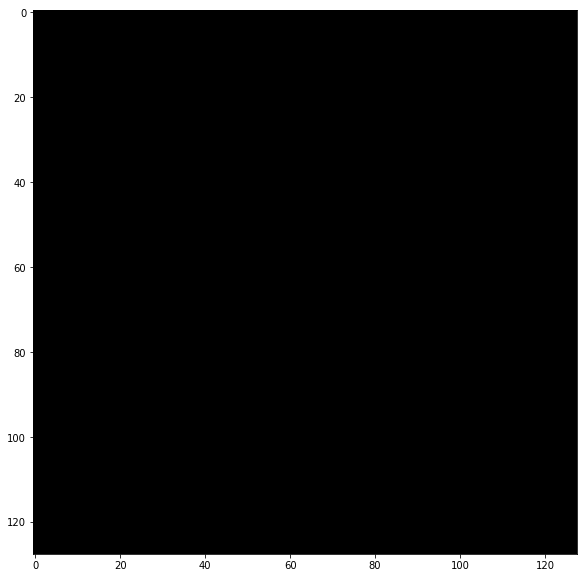

KeyboardInterrupt: 

In [35]:
# Generating training images and masks from dataset

img_height_in = 128
img_width_in = 128
img_height_out = 1024
img_width_out = 1024
img_channel = 1

# Get train images and masks
X_train = np.zeros((len(train_set_a), img_height_in, img_width_in, img_channel), dtype=np.uint8)
Y_train = np.zeros((len(train_set_a), img_height_out, img_width_out, 1), dtype=np.bool)

print('Retrieving training images and masks ... ')
sys.stdout.flush()

# rle2mask credit to: https://www.kaggle.com/freeman89/eda-can-you-see-the-pneumothorax

def rle2mask(rle, width, height):
    mask= np.zeros(width * height)
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]
    current_position = 0
    for index, start in enumerate(starts):
        current_position += start
        mask[current_position:current_position+lengths[index]] = 255
        current_position += lengths[index]
    return mask.reshape(width, height)

# Original source code credit to: https://www.kaggle.com/jesperdramsch/intro-chest-xray-dicom-viz-u-nets-full-data
# and https://www.kaggle.com/smerllo/finding-pneumothorax-distribution. 
# Code has been adapted hence discrepancies.

for n, _id in tqdm.tqdm_notebook(enumerate(train_set_a), total=len(train_set_a)):
    train_data = pydicom.read_file(_id)
    tmp_img = resize(train_data.pixel_array, (img_height_in, img_width_in, 1), anti_aliasing=True).reshape(img_height_in, img_width_in, 1)
    plt.figure(figsize=(10, 10))
    plt.imshow(tmp_img.reshape(128,128), cmap=plt.cm.bone)
    plt.show()
    X_train[n] = deepcopy(tmp_img)
    plt.figure(figsize=(10, 10))
    plt.imshow(X_train[n].reshape(128,128), cmap=plt.cm.bone)
    plt.show()
    try:
        if '-1' in df_full.loc[_id.split('/')[-1][:-4],' EncodedPixels']:
            Y_train[n] = np.zeros((1024, 1024, 1))
        else:
            if type(df_full.loc[_id.split('/')[-1][:-4],' EncodedPixels']) == str:
                Y_train[n] = np.reshape(rle2mask(df_full.loc[_id.split('/')[-1][:-4],' EncodedPixels'], 1024, 1024), \
                                        (1024, 1024, 1))
            else:
                Y_train[n] = np.zeros((1024, 1024, 1))
                for x in df_full.loc[_id.split('/')[-1][:-4],' EncodedPixels']:
                    Y_train[n] =  Y_train[n] + np.reshape(rle2mask(x, 1024, 1024), (1024, 1024, 1))
    except KeyError:
        print(f"Key {_id.split('/')[-1][:-4]} is without mask; hence non-diagnostic.")
        Y_train[n] = np.zeros((1024, 1024, 1)) # Assume missing masks are empty masks.

print('Completed retreival of all training images and masks.')

In [11]:
X_train.shape

(7498, 128, 128, 1)

In [12]:
Y_train.shape

(7498, 1024, 1024, 1)

TypeError: Invalid dimensions for image data

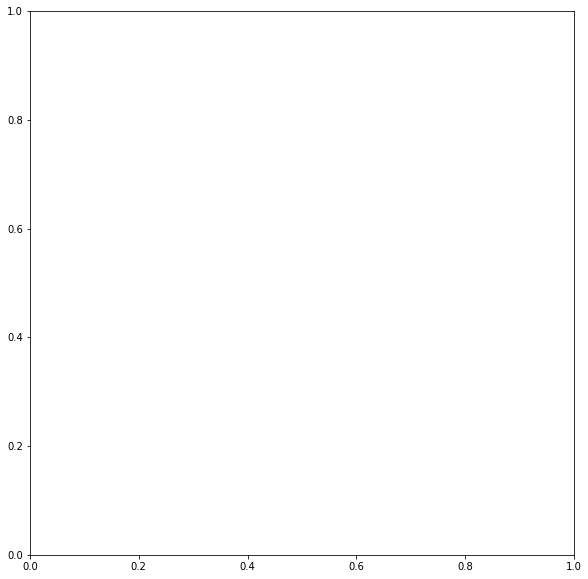

In [17]:
# Testing images

test_img = X_train[13]

plt.figure(figsize=(10, 10))
plt.imshow(test_img, cmap=plt.cm.bone)
plt.show()

In [14]:
Y_train = Y_train.transform((0,2,1,3))

AttributeError: 'numpy.ndarray' object has no attribute 'transform'

In [ ]:
# Testing masks

test_mask = Y_train[13].reshape(1024, 1024)

print(np.sum(test_mask))

plt.figure(figsize=(10, 10))
plt.imshow(test_mask, cmap=plt.cm.bone)
plt.show()

In [ ]:
start = 33  # Start index of images
num_img = 5  # Total number of images to show

fig, ax = plt.subplots(nrows=1, ncols=num_img, sharey=True, figsize=(10,10))
for i, img_file in enumerate(X_train[start:start+num_img]):
    for j, mask_file in enumerate(Y_train[start:start+num_img]):
        img = img_file.reshape(1024, 1024)
        if j == i:
            mask = mask_file.reshape(1024, 1024).T
            ax[i].imshow(img, cmap=plt.cm.bone)
            ax[i].imshow(mask, alpha=0.3, cmap="Reds")
            if np.sum(mask) == 0:
                ax[i].set_title('Nothing to show.')
            elif np.sum(mask) > 0:
                ax[i].set_title('Please see marker.')

Yolo (Faster R-CNN is preferred) for object detection Use cuDNN for optimization

Pre-process to feed image into DL models

Selection of CNNs- Train and test different CNNs (VGG16, VGG19, Inceptionv3, and Resnet50). We can also test for 3D-CNNs. Using U-Net can also be tested. I do not recommend using Capsule Networks as we have never coded it, neither could I find a good reference.

Output and Verification as per the contest requirements

In [ ]:
#U-net code stolen mostly from https://www.depends-on-the-definition.com/unet-keras-segmenting-images/

In [ ]:
def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True):
    # first layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    # second layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(x)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

In [ ]:
def get_unet(input_img, n_filters=16, dropout=0.5, batchnorm=True):
    # contracting path
    c1 = conv2d_block(input_img, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    p1 = MaxPooling2D((2, 2)) (c1)
    p1 = Dropout(dropout*0.5)(p1)

    c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)
    p2 = MaxPooling2D((2, 2)) (c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)
    p3 = MaxPooling2D((2, 2)) (c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters=n_filters*16, kernel_size=3, batchnorm=batchnorm)
    
    # expansive path
    u6 = Conv2DTranspose(n_filters*8, (3, 3), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)

    u7 = Conv2DTranspose(n_filters*4, (3, 3), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)

    u8 = Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)

    u9 = Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [ ]:
input_img = Input((im_height, im_width, 1), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)

model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy"])
model.summary()

In [ ]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=3, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model-out.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [ ]:
results = model.fit(X_train, y_train, batch_size=32, epochs=100, callbacks=callbacks, validation_split=0.1)